# Exploratory Data Analysis (EDA) - Statmodels (Smoothing, ARIMA, SAMIRAX), and FB Prophet Modelling and Evaluating

# Introduction and Project Objective

The objective is to forecast 28 days of sales. Walmart donated sales data recorded from January 29, 2011 to June 19, 2016. The sales data is hierarchical data set. The following graphic shows how the data set is broken down.

MOFC. (2020). The M5 Competition Competitor's Guide. Retrieved from: https://mofc.unic.ac.cy/m5-competition/

In this hierarchical time series dataset, the break down is the products are sold in three states: California, Texas, and Wisconsin. In California there are four stores, Texas there are three stores, and Wisconsin there are three stores. The three categories of the products sold are hobbies, foods, and household.

# Dataset Description

The M5 dataset, generously made available by Walmart, involves the unit sales of various products sold in the USA, organized in the form of grouped time series. More specifically, the dataset involves the unit sales of 3,049 products, classified in 3 product categories (Hobbies, Foods, and Household) and 7 product departments, in which the above-mentioned categories are disaggregated.  The products are sold across ten stores, located in three States (CA, TX, and WI). In this respect, the bottom-level of the hierarchy, i.e., product-store unit sales can be mapped across either product categories or geographical regions, as follows:

Reference:
MOFC. (2020). The M5 Competition Competitors' Guide. Retrieved from:  https://mofc.unic.ac.cy/m5-competition/ 


# File 1: calendar.csv

Contains the dates on which products are sold. The dates are in a yyyy/dd/mm format.

date: The date in a “y-m-d” format.

wm_yr_wk: The id of the week the date belongs to.

weekday: The type of the day (Saturday, Sunday, ..., Friday).

wday: The id of the weekday, starting from Saturday.

month: The month of the date.

year: The year of the date.

event_name_1: If the date includes an event, the name of this event.

event_type_1: If the date includes an event, the type of this event.

event_name_2: If the date includes a second event, the name of this event.

event_type_2: If the date includes a second event, the type of this event.

snap_CA, snap_TX, and snap_WI: A binary variable (0 or 1) indicating whether the stores of CA, TX or WI allow SNAP 3 purchases on the examined date. 1 indicates that SNAP purchases are allowed.

# File 2: sales_train_validation.csv

Contains the historical daily unit sales data per product and store [d_1 - d_1913].

item_id: The id of the product.

dept_id: The id of the department the product belongs to.

cat_id: The id of the category the product belongs to.

store_id: The id of the store where the product is sold.

state_id: The State where the store is located. d_1, d_2, ..., d_i, ... d_1941: The number of units sold at day i, starting from 2011-01-29.

# File 3: sell_prices.csv

Contains information about the price of the products sold per store and date.

store_id: The id of the store where the product is sold.

item_id: The id of the product.

wm_yr_wk: The id of the week.

sell_price: The price of the product for the given week/store. The price is provided per week (average across seven days). If not available, this means that the product was not sold during the examined week.

Note that although prices are constant at weekly basis, they may change through time (both training and test set).

# File 4: submission.csv

Demonstrates the correct format for submission to the competition.

Each row contains an id that is a concatenation of an item_id and a store_id, which is either validation (corresponding to the Public leaderboard), or evaluation (corresponding to the Private leaderboard). You are predicting 28 forecast days (F1-F28) of items sold for each row. For the validation rows, this corresponds to d_1914 - d_1941, and for the evaluation rows, this corresponds to d_1942 - d_1969. (Note: a month before the competition close, the ground truth for the validation rows will be provided.)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle
from statsmodels.tsa.seasonal import seasonal_decompose


plt.style.use('bmh')
color_pal=plt.rcParams['axes.prop_cycle'].by_key()['color']
color_cycle=cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])

import pywt

In [2]:
# Read the data
cal_data = pd.read_csv('m5_data/calendar.csv')
sellp_data = pd.read_csv('m5_data/sell_prices.csv')
ss_data = pd.read_csv('m5_data/sample_submission.csv') 
salestv_data = pd.read_csv('m5_data/sales_train_validation.csv')

In [3]:
ss_data.head()

,id,F1,F2,F3,F4,F5,F6,F7,F8,F9,...,F19,F20,F21,F22,F23,F24,F25,F26,F27,F28
0,HOBBIES_1_001_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,HOBBIES_1_002_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,HOBBIES_1_004_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,HOBBIES_1_005_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
salestv_data.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


In [5]:
cal_data.head()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


In [6]:
sellp_data.head()

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26


# Visualizing the data for a single item that sells frequently

### 1. Simply plotting the sales for a specific item to understand the trend

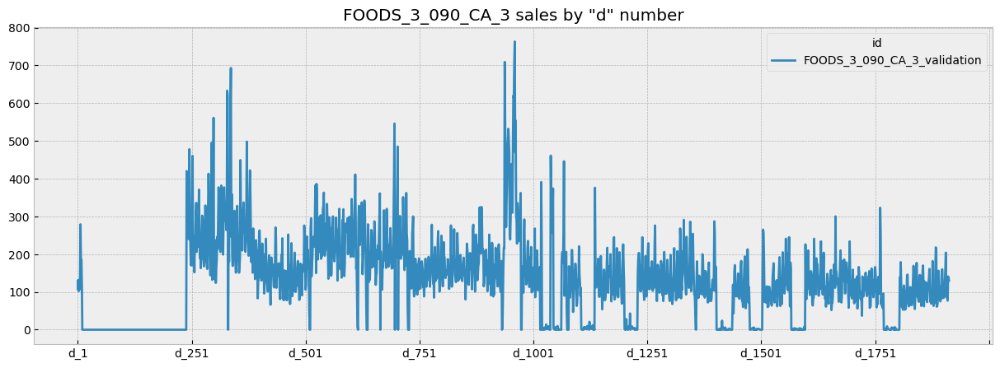

In [7]:
d_cols=[c for c in salestv_data.columns if 'd_' in c]
salestv_data.loc[salestv_data['id']=='FOODS_3_090_CA_3_validation'].set_index('id')[d_cols].T \
.plot(figsize=(15,5), title='FOODS_3_090_CA_3 sales by "d" number',color=next(color_cycle))
plt.show()

### 2.1 Plotting a random sample sales data by merging with calendar data to plot exact dates on x-axis 

In [8]:
ids = ['FOODS_3_090_CA_3_validation', 'HOBBIES_1_234_CA_3_validation', 'HOUSEHOLD_1_118_CA_3_validation', 'HOBBIES_1_001_CA_1_validation']
examples = []

# General function to extract specific item Id values from sales_train_evaluation dataset and
# Merge calendar date with sales_train_evaluation date
for i in range(len(ids)):
    examples.append(salestv_data.loc[salestv_data['id']== ids[i]][d_cols].T)
    examples[i] = examples[i].rename(columns={examples[i].columns.values[0] : ids[i]})
    examples[i] = examples[i].reset_index().rename(columns={'index':'d'})
    examples[i] = examples[i].merge(cal_data)


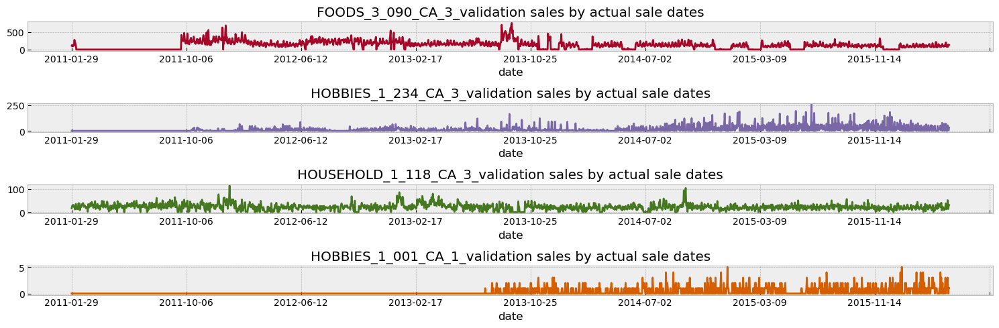

In [9]:
fig, axs = plt.subplots(len(ids),1,figsize=(15,10)) 
ax_id=0

for id in range(len(ids)):
    # Set date as the index of dataframe to be plotted properly and only fetch specific Id sales value
    examples[id].set_index('date')[ids[id]] \
    .plot(figsize=(15,5), color=next(color_cycle), title= f'{ids[id]} sales by actual sale dates', ax=axs[ax_id] if len(ids)!=1 else axs)
    
    ax_id+=1
plt.tight_layout()
plt.show()




### 2.2 Plot the sample sale snippet, kind of zooming technique 

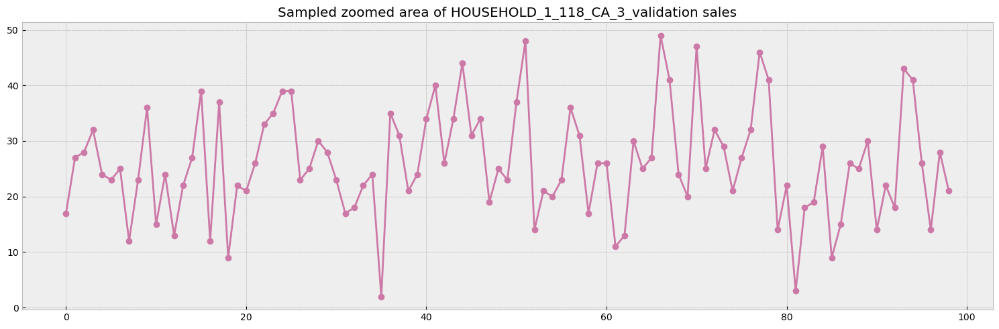

In [10]:
# last 99 days
graph_ids = [2]
fig, axs = plt.subplots(len(graph_ids),1,figsize=(15,10)) 
if len(graph_ids) != 1 : axs=axs.flatten() 

ax_id=0
for graph_id in graph_ids:
    examples[graph_id][:99][ids[graph_id]].plot(figsize=(15,5),color=next(color_cycle), marker='o',
                                                title=f'Sampled zoomed area of {ids[graph_id]} sales', ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    ax_id+=1
plt.tight_layout()
plt.show()

### 3. Deniosing sales to know underlying trends  

#### 3.1. Wavelet denoising - calculate wavelet coefficeints and discard low coefficients 

In [11]:
# Return Mean absolute deviation value
def maddest(d, axis=None):
    return np.mean(np.absolute(d-np.mean(d,axis)), axis)

# Denoise the signal
def denoise(x, wavelet='db4',level=1):
    coeff = pywt.wavedec(x,wavelet,mode='per')
    sigma=(1/0.6745)*maddest(coeff[-level])
    
    uthresh=sigma*np.sqrt(2*np.log(len(x)))
    coeff[1:]=(pywt.threshold(i,value=uthresh,mode='hard') for i in coeff[1:])
    return pywt.waverec(coeff,wavelet,mode='per')

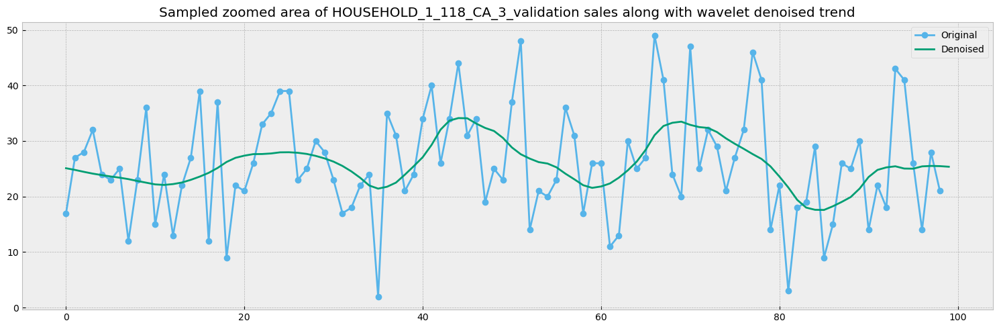

In [12]:
fig, axs = plt.subplots(len(graph_ids),1,figsize=(15,10)) 
if len(graph_ids) != 1 : axs=axs.flatten()

def list_to_df(list_obj):
    return pd.Series(list_obj)

# noise deleted data look like
ax_id=0
for graph_id in graph_ids:
    examples[graph_id][ids[graph_id]][:99].plot(figsize=(15,5),color=next(color_cycle), marker='o', label='Original',
                                                title=f'Sampled zoomed area of {ids[graph_id]} sales along with wavelet denoised trend', ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    list_to_df(denoise(examples[graph_id][ids[graph_id]][:99])).plot(figsize=(15,5),color=next(color_cycle), label='Denoised',
                                                ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    axs[ax_id].legend() if len(graph_ids)!=1 else axs.legend()
    ax_id+=1
    
plt.tight_layout()
plt.show()

#### Plotting original sales and denoised sales side-by-side for better understanding the trend (last 99 day data)

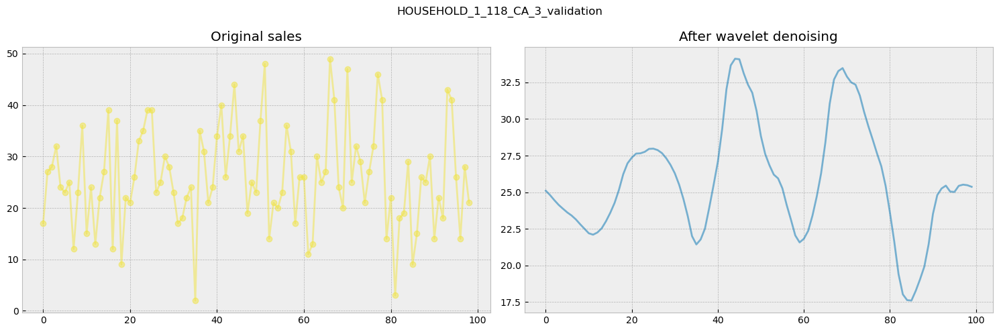

In [13]:
fig, axs = plt.subplots(len(graph_ids),2,figsize=(30,10)) 
axs=axs.flatten() 

ax_id=0
for graph_id in graph_ids:
    examples[graph_id][ids[graph_id]][:99].plot(figsize=(15,5),color=next(color_cycle), marker='o', alpha=0.5,
                                                title='Original sales', ax=axs[ax_id])
    ax_id+=1
    list_to_df(denoise(examples[graph_id][ids[graph_id]][:99])).plot(figsize=(15,5),color=next(color_cycle), alpha=0.5,
                                                                     title='After wavelet denoising', ax=axs[ax_id])
    ax_id+=1
    plt.suptitle(f'{ids[graph_id]}')
plt.tight_layout()
plt.show()

### 3.2. Average smoothing or rolling mean denoising
### - A method that uses window & stride concept to denoise the data by taking mean of windowed elements and moving the window by stride 

In [14]:
def average_smoothing(x, window=3, stride=1):
    new_x = []
    start = 0
    end = window
    while end<=len(x):
        new_x.extend(np.ones(end-start)*np.mean(x[start:end]))
        start = start + stride
        end = end + stride
    return np.array(new_x)

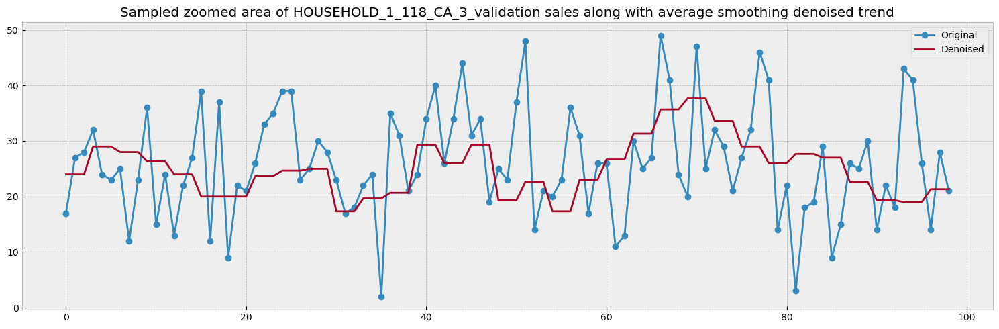

In [15]:
fig, axs = plt.subplots(len(graph_ids),1,figsize=(15,10)) 
if len(graph_ids) != 1 : axs=axs.flatten() 

ax_id=0
for graph_id in graph_ids:
    examples[graph_id][ids[graph_id]][:99].plot(figsize=(15,5),color=next(color_cycle), marker='o', label='Original',
                                                title=f'Sampled zoomed area of {ids[graph_id]} sales along with average smoothing denoised trend', ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    list_to_df(average_smoothing(examples[graph_id][ids[graph_id]])[:99]).plot(figsize=(15,5),color=next(color_cycle), label='Denoised',
                                                ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    axs[ax_id].legend() if len(graph_ids)!=1 else axs.legend()
    ax_id+=1
    
plt.tight_layout()
plt.show()

### Plotting original sales and denoised sales side-by-side for better understanding the trend

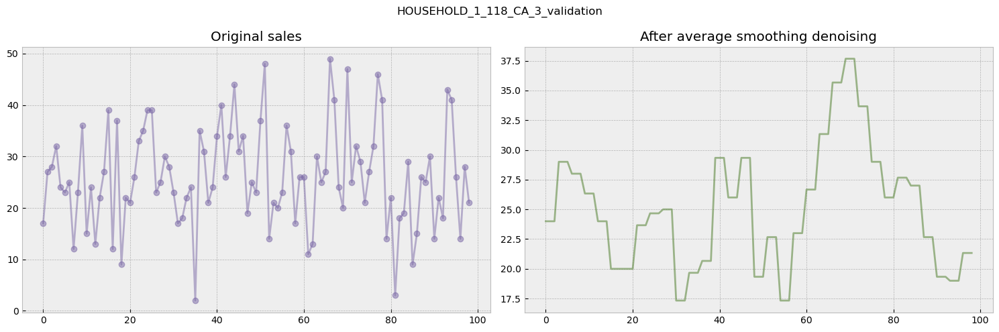

In [16]:
fig, axs = plt.subplots(len(graph_ids),2,figsize=(30,10)) 
axs=axs.flatten() 

ax_id=0
for graph_id in graph_ids:
    examples[graph_id][ids[graph_id]][:99].plot(figsize=(15,5),color=next(color_cycle), marker='o', alpha=0.5,
                                                title='Original sales', ax=axs[ax_id])
    ax_id+=1
    list_to_df(average_smoothing(examples[graph_id][ids[graph_id]])[:99]).plot(figsize=(15,5),color=next(color_cycle), alpha=0.5,
                                                                     title='After average smoothing denoising', ax=axs[ax_id])
    ax_id+=1
    plt.suptitle(f'{ids[graph_id]}')
plt.tight_layout()
plt.show()

## Sales broken down by day of the week, month & year

/var/folders/h2/nzdrmmqs66x13b1h4f0882fh0000gn/T/ipykernel_1858/3010717349.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  examples[i].groupby('wday').mean()[ids[i]] \
/var/folders/h2/nzdrmmqs66x13b1h4f0882fh0000gn/T/ipykernel_1858/3010717349.py:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  examples[i].groupby('month').mean()[ids[i]] \
/var/folders/h2/nzdrmmqs66x13b1h4f0882fh0000gn/T/ipykernel_1858/3010717349.py:10: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select onl

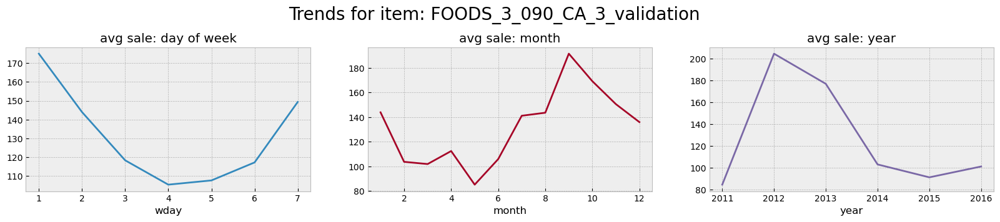

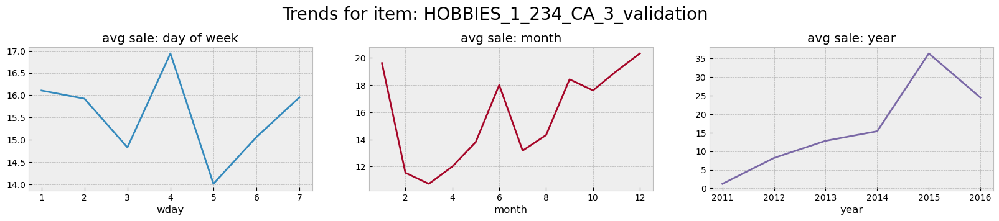

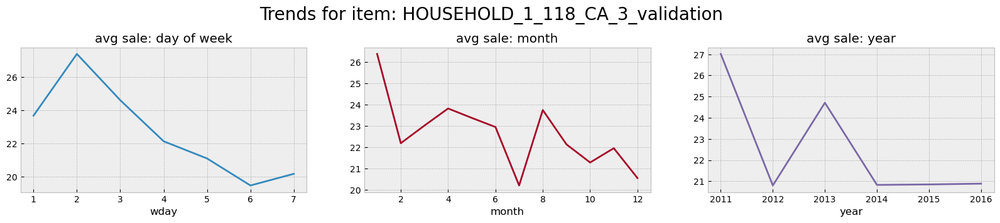

In [17]:
for i in [0, 1, 2]:
    fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(20,3))
    # Groupby wday colum and do mean or count etc. to values of other columns & then, extract the specific sales Id column  
    examples[i].groupby('wday').mean()[ids[i]] \
    .plot(kind='line', title='avg sale: day of week', color=color_pal[0], ax=ax1)
    
    examples[i].groupby('month').mean()[ids[i]] \
    .plot(kind='line', title='avg sale: month', color=color_pal[1], ax=ax2)
    
    examples[i].groupby('year').mean()[ids[i]] \
    .plot(kind='line', title='avg sale: year', color=color_pal[2], ax=ax3)
    
    fig.suptitle(f'Trends for item: {ids[i]}', size=20, y=1.1)

# Visualizing random 20 different items with their sales to analyze some trends

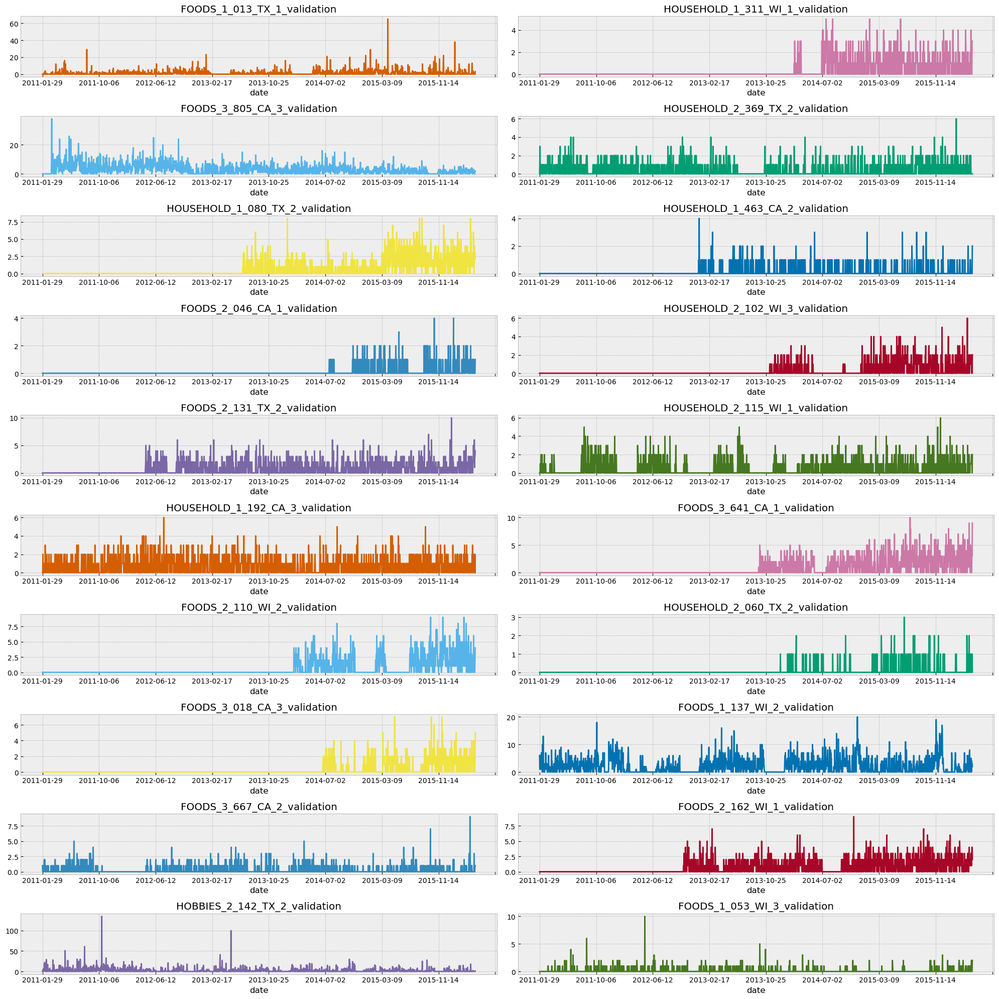

In [18]:
twenty_examples = salestv_data.sample(20, random_state=529) # Sample random 20 samples from the salestv dataframe
list_of_sampled_id = list(twenty_examples['id']) # Extract the list of sampled id of items so as to just keep these id values in the dataframe eventually
twenty_examples = twenty_examples.set_index('id')[d_cols].T # Set the index of dataframe to be id column, select only the d columns & transform the 
twenty_examples = twenty_examples.reset_index().rename(columns={'index':'d'})
twenty_examples = twenty_examples.merge(cal_data)
twenty_examples = twenty_examples.set_index('date')[list_of_sampled_id] 


fig, axs = plt.subplots(10,2,figsize=(20,20))
axs = axs.flatten()

axs_id=0
for item in twenty_examples.columns:
    twenty_examples[item].plot(title=item, color=next(color_cycle), ax=axs[axs_id])
    axs_id+=1
plt.tight_layout()
plt.show()

# Sales over time by category type

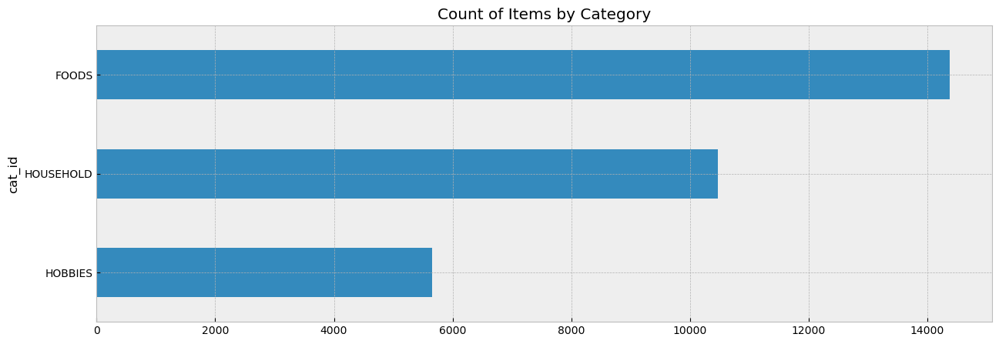

In [19]:
# Plot of count of Items by category
salestv_data.groupby('cat_id').count()['id'].sort_values().plot(kind='barh', title='Count of Items by Category', figsize=(15,5))
plt.show()

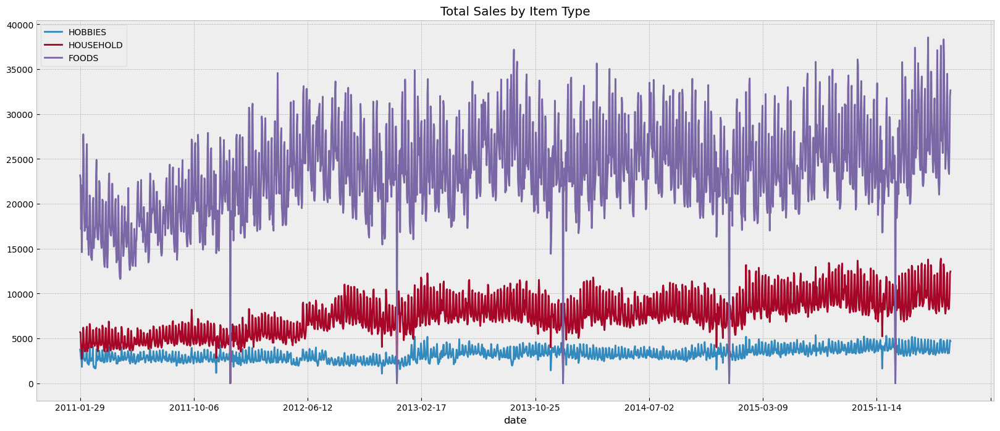

In [20]:
past_sales_item = salestv_data.set_index('id')[d_cols].T \
.merge(cal_data.set_index('d')['date'], left_index=True, right_index=True).set_index('date')

for i in salestv_data['cat_id'].unique():
    items_col = [c for c in past_sales_item.columns if i in c]
    past_sales_item[items_col].sum(axis=1).plot(figsize=(20,8), title='Total Sales by Item Type')

plt.legend(salestv_data['cat_id'].unique())
plt.show()

## Roll out of Items being sold

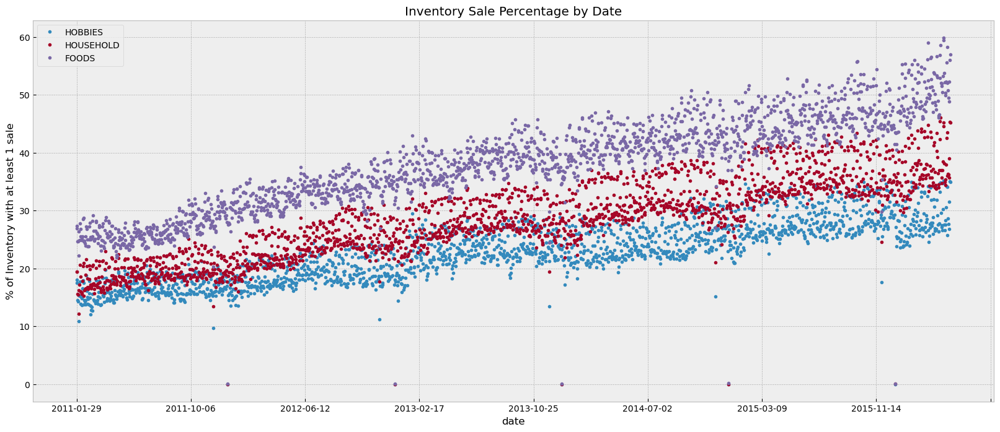

In [21]:
# Give the value of 0 or 1 to rows with no value or some value respectively, trim values to input thresholds

past_sales_clipped = past_sales_item.clip(0,1) 
for i in salestv_data['cat_id'].unique():
    items_col = [c for c in past_sales_clipped.columns if i in c]
    (past_sales_clipped[items_col].mean(axis=1)*100).plot(figsize=(20,8), style='.', title='Inventory Sale Percentage by Date')
plt.ylabel('% of Inventory with at least 1 sale')
plt.legend(salestv_data['cat_id'].unique())
plt.show()


# Sales by store category

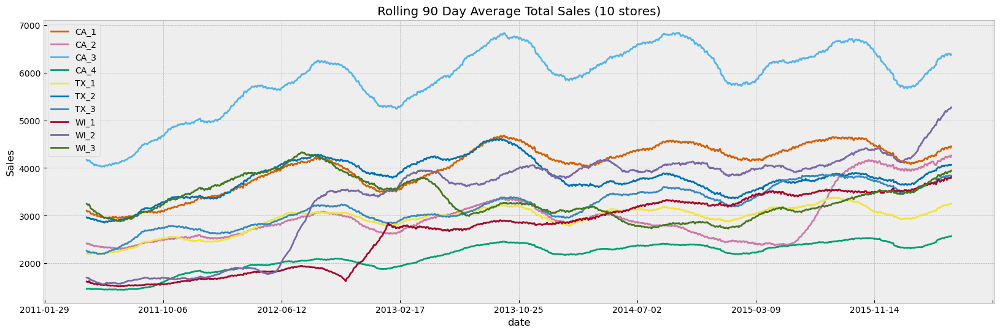

In [22]:
# Rolling 90 day average of sales 

store_list = sellp_data['store_id'].unique()
for i in store_list:
    store_items = [c for c in past_sales_item.columns if i in c]
    past_sales_item[store_items].sum(axis=1).rolling(90).mean() \
    .plot(kind='line', figsize=(20,6), color=next(color_cycle), title='Rolling 90 Day Average Total Sales (10 stores)')

plt.ylabel('Sales')
plt.legend(store_list)
plt.show()

## Rolling 90 day whisker plot for average sales and store - by plotly

In [23]:
import plotly.graph_objects as go
fig=go.Figure()

for i, s in enumerate(store_list):
    store_items = [c for c in past_sales_item.columns if s in c]
    data = past_sales_item[store_items].sum(axis=1).rolling(90).mean()
    fig.add_trace(go.Box(x=[s]*len(data), y=data, name=s))
fig.update_layout(yaxis_title="Sales", xaxis_title="Stores", title="90 day rolling average sale vs store name - via plotly")


## Mean sales of store 

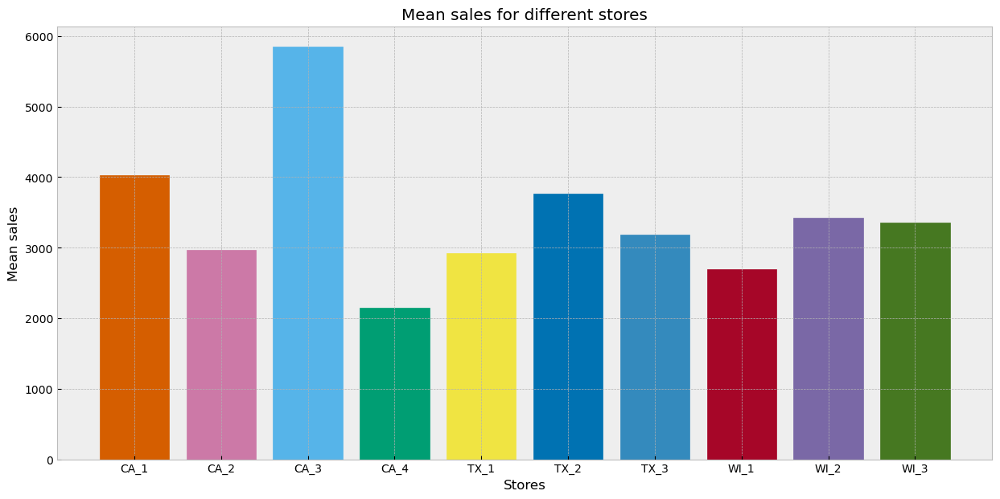

In [24]:
mean_value_store = []
for s in store_list:
    store_items = [c for c in past_sales_item if s in c]
    mean_value_store.append(np.mean(past_sales_item[store_items].sum(axis=1)))

plt.figure(figsize=(15,7))
bplot = plt.bar(store_list,mean_value_store)

colors = [next(color_cycle) for i in range(0,len(store_list))]
for i, b in enumerate(bplot):
    b.set_color(colors[i])
    
plt.xlabel('Stores')
plt.ylabel('Mean sales')
plt.title('Mean sales for different stores')
plt.show()

# Rolling 7 day demand count by store 

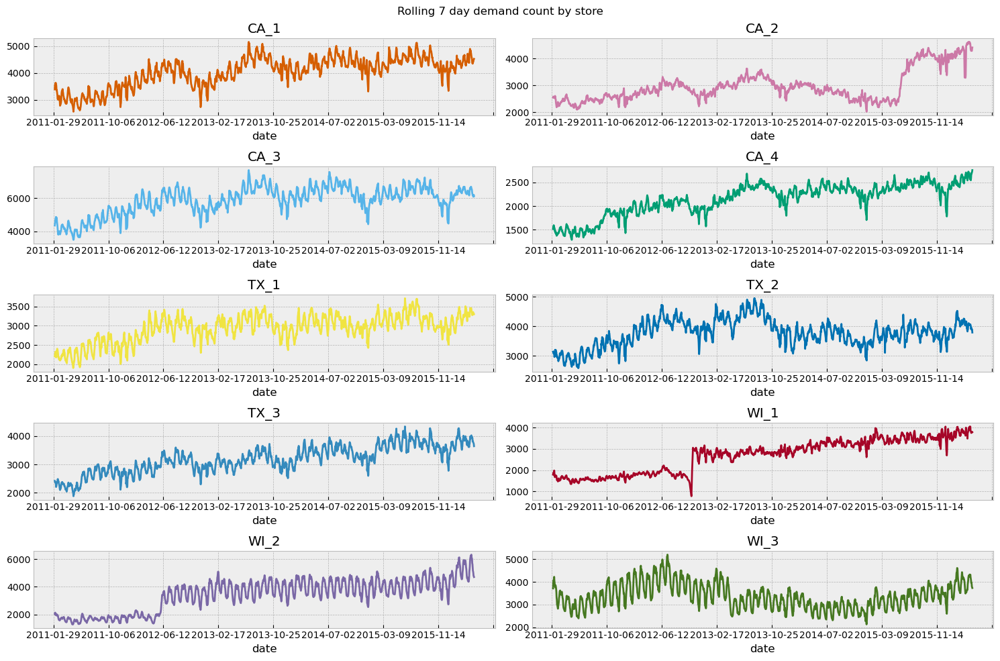

In [25]:
fig, axs = plt.subplots(5,2,figsize=(15,10))
axs=axs.flatten()
ax_id=0

for i in sellp_data['store_id'].unique():
    store_items = [c for c in past_sales_item.columns if i in c]
    past_sales_item[store_items].sum(axis=1) \
    .rolling(7).mean() \
    .plot(title=i, color=next(color_cycle), ax=axs[ax_id])
    
    ax_id+=1

plt.suptitle('Rolling 7 day demand count by store')
plt.tight_layout()
plt.show()


# Sale prices EDA

1. Sale price of one of the most selling product over the years along different stores

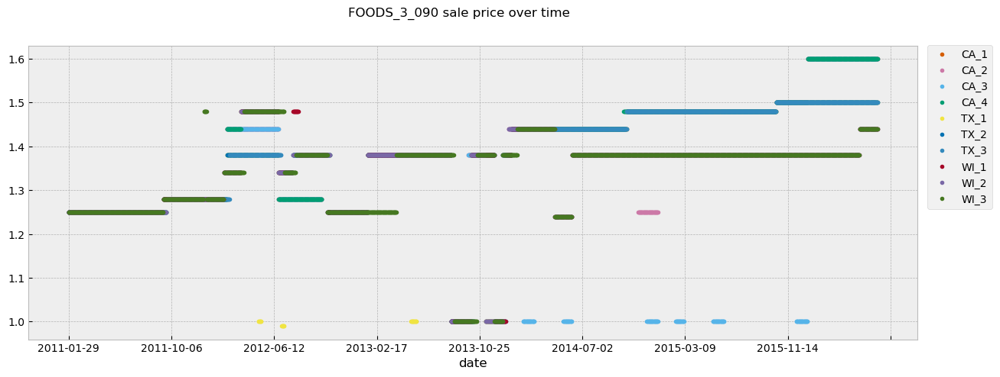

In [26]:
fig, axs = plt.subplots(figsize=(15,5))
stores=[]

for store, d in sellp_data.query('item_id == "FOODS_3_090"').groupby('store_id'):
    # Merge cal_data with wm_yr_wk to plot against actual dates
    merged_d = d.set_index('wm_yr_wk').merge(cal_data.set_index('wm_yr_wk'),left_index=True, right_index=True)
    # Plot the sales over time 
    merged_d.plot(x='date', y='sell_price', color=next(color_cycle), ax=axs, legend=store, style='.')
    stores.append(store)

plt.legend(stores, bbox_to_anchor=(1.09,1.02))
plt.suptitle('FOODS_3_090 sale price over time')
plt.show()

2. Log distribution of sale price for different food categories 

In [27]:
# Add a category column to sellp data 
sellp_data['Category'] = sellp_data['item_id'].apply(lambda x: x.split('_')[0])

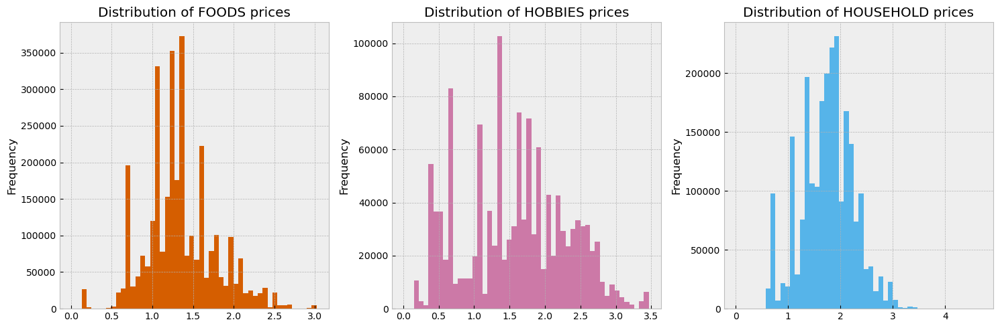

In [28]:
fig, axs = plt.subplots(1,3,figsize=(15,5))
ax_id=0

for cat, d in sellp_data.groupby('Category'):
    # Do the log of values of sell_price columns & plot it's histogram distribution
    d['sell_price'].apply(np.log1p).plot(kind='hist', bins=50,ax=axs[ax_id], color=next(color_cycle), title=f"Distribution of {cat} prices")
    ax_id+=1
        
plt.tight_layout()
plt.show()

# Modeling

In [29]:
salestv_data.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


In [30]:
train_dataset = salestv_data[d_cols[:-30]]
val_dataset = salestv_data[d_cols[-30:]]

print(val_dataset.values)

[[1 1 1 ... 0 1 1]
 [1 1 1 ... 0 0 0]
 [1 0 0 ... 1 1 1]
 ...
 [0 1 1 ... 0 1 0]
 [2 4 3 ... 3 1 3]
 [0 5 7 ... 0 0 0]]


In [31]:
train_dataset

,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,...,d_1874,d_1875,d_1876,d_1877,d_1878,d_1879,d_1880,d_1881,d_1882,d_1883
0,0,0,0,0,0,0,0,0,0,0,...,1,1,3,1,3,1,2,2,0,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,1,3,4,2,1,4,1,3,5,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,3,2,2,2,3,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,0,0,2,2,0,3,1,4,1,0,...,0,0,0,0,0,0,0,0,0,0
30486,0,0,0,0,0,5,0,1,1,3,...,0,0,0,0,0,0,0,0,0,0
30487,0,6,0,2,2,4,1,8,5,2,...,1,1,2,0,0,2,0,0,0,2
30488,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,0,2,1,1


In [32]:
val_dataset

,d_1884,d_1885,d_1886,d_1887,d_1888,d_1889,d_1890,d_1891,d_1892,d_1893,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,1,1,1,0,0,0,0,0,1,0,...,1,3,0,1,1,1,3,0,1,1
1,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,1,0,0,0,0,0,0,0,1,0,...,2,1,2,1,1,1,0,1,1,1
3,6,6,0,0,0,0,3,1,2,1,...,1,0,5,4,1,0,1,3,7,2
4,0,0,1,0,4,4,0,1,4,0,...,2,1,1,0,1,1,2,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,0,0,0,0,0,0,0,0,0,0,...,2,0,0,0,0,0,1,0,0,1
30486,0,0,0,0,0,0,0,1,1,2,...,0,0,0,0,0,0,0,0,1,0
30487,0,1,1,0,0,0,0,1,1,2,...,2,1,0,2,0,1,0,0,1,0
30488,2,4,3,0,0,0,0,0,1,1,...,0,0,1,0,0,1,0,3,1,3


In [68]:
# Utility function to plot graph
def plot_graphs(ids, pred=[], pred_value=False):
    fig, axs = plt.subplots(len(ids), 1, figsize=(20,5))
    if len(ids)!=1 : axs = axs.flatten()
    
    if len(ids)==1:
        axs.plot(list(train_dataset.T[-30:].T.loc[ids[0]].keys()), train_dataset.T[-30:].T.loc[ids[0]].values)
        axs.plot(list(val_dataset.loc[ids[0]].keys()), val_dataset.loc[ids[0]].values)
        if pred_value and pred.any():
            axs.plot(list(val_dataset.loc[ids[0]].keys()), pred[ids[0]])
        axs.tick_params(axis='x', rotation=90)
    else:
        ax_id=0
        for i in ids:
            axs[ax_id].plot(list(train_dataset.T[-30:].T.loc[i].keys()), train_dataset.T[-30:].T.loc[i].values)
            axs[ax_id].plot(list(val_dataset.loc[i].keys()), val_dataset.loc[i].values)
            if pred_value and pred.any():
                axs[ax_id].plot(list(val_dataset.loc[i].keys()), pred[i])
            axs[ax_id].tick_params(axis='x', rotation=90)
            ax_id+=1
    plt.suptitle('Plot of few items with train and validation data respectively for {}'.format(ids))
    plt.tight_layout()
    plt.show()   

    Plot the train & validation data to compare further model predictions 

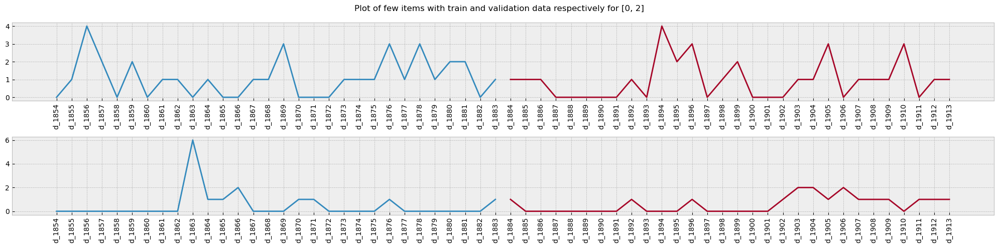

In [69]:
ids = [0, 2]
plot_graphs(ids, [], False)

## 1. Naive approach - forecast the next day sales as current day sales

Estimating technique in which the last period's actuals are used as this period's forecast, without adjusting them or attempting to establish causal factors. It is used only for comparison with the forecasts generated by the better (sophisticated) techniques.

In [70]:
def naive_approach():
    predictions=[]
    for i in range(len(val_dataset.columns)):
        if i==0:
            predictions.append(train_dataset[train_dataset.columns[-1]].values)
        else:
            predictions.append(val_dataset[val_dataset.columns[i-1]].values)
    predictions = np.transpose(np.array([list(row) for row in predictions]))
    error_norm = np.linalg.norm(predictions[:3]-val_dataset[:3]/len(predictions[0]))
    return predictions, float(error_norm)

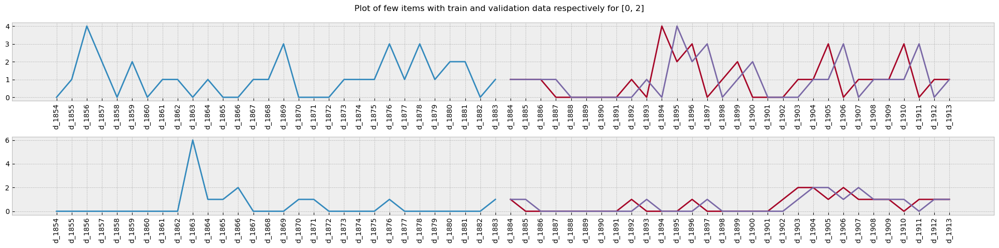

In [72]:
ids=[0, 2]
pred, error_naive=naive_approach()
plot_graphs(ids, pred, True)

## 2. Moving average - Take past days (like 30) into consideration to predict the future values 

The moving average is a statistical method used for forecasting long-term trends. The technique represents taking an average of a set of numbers in a given range while moving the range.

In [73]:
def moving_average(window=70):
    predictions = []
    for i in range(0, len(val_dataset.columns)):
        if i==0:
            predictions.append(np.mean(train_dataset[train_dataset.columns[-window:]].values, axis=1))
        if i>0 and i<=window:
            predictions.append(np.mean(train_dataset[train_dataset.columns[-window+i:]].values, axis=1) + np.mean(val_dataset[val_dataset.columns[:i]].values, axis=1))
        if i>(window+1):
            predictions.append(np.mean(val_dataset[val_dataset.columns[:i]].values, axis=1))
    predictions=np.transpose(np.array([list(row) for row in predictions]))
    error_norm = np.linalg.norm(predictions-val_dataset/len(predictions[0]))
    return predictions, float(error_norm)

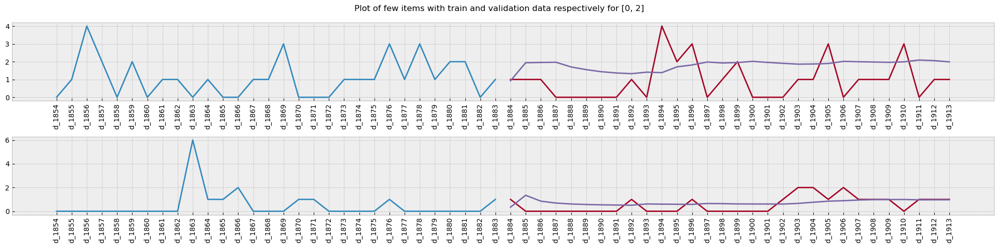

In [74]:
ids=[0, 2]
pred, error_moving = moving_average()
plot_graphs(ids, pred, True)

In [75]:
def moving_average(window=30):
    predictions = []
    for i in range(0, len(val_dataset.columns)):
        if i==0:
            predictions.append(np.mean(train_dataset[train_dataset.columns[-window:]].values, axis=1))
        if i>0 and i<=window:
            predictions.append(np.mean(train_dataset[train_dataset.columns[-window+i:]].values, axis=1) + np.mean(val_dataset[val_dataset.columns[:i]].values, axis=1))
        if i>(window+1):
            predictions.append(np.mean(val_dataset[val_dataset.columns[:i]].values, axis=1))
    predictions=np.transpose(np.array([list(row) for row in predictions]))
    error_norm = np.linalg.norm(predictions[:3]-val_dataset[:3]/len(predictions[0]))
    return predictions, float(error_norm)

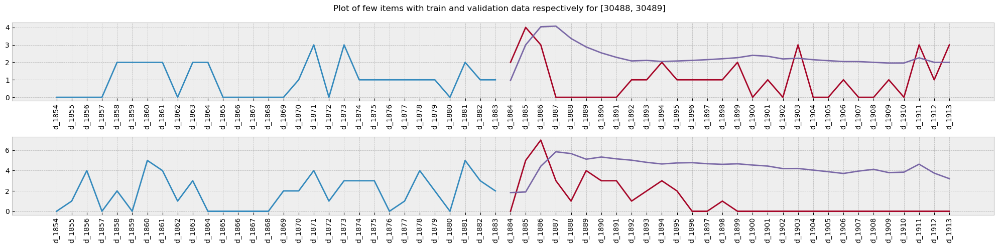

In [79]:
ids=[30488, 30489]
pred, error_moving = moving_average()
plot_graphs(ids, pred, True)

## 3. Holt Linear -  Exponential smoothing with trend but no seasonality:

Holt Linear Exponential Smoothing is a forecasting method that uses level smoothing and trend smoothing to predict future values in a time series. It involves two smoothing parameters, alpha and beta, and assumes a linear trend. The method is useful when the data has a trend but no seasonality.

In [80]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from tqdm.notebook import tqdm as tqdm

# *** I am training for last 30 days of first 3 product but the models (HOLT, HOLT WİNTER, SARIMA-X, PROPHET) are designed for all products for all available dates. Also I am getting norm error loss mean for this 3 product to be able to understand model permormance ***

In [99]:
#last 30 days of first 3 product
def holt_smoothing():
    predictions = []
    for row in tqdm(train_dataset[train_dataset.columns[-30:]].values[:3]):
        fit = Holt(row).fit(smoothing_level=0.3, smoothing_slope=0.01)
        predictions.append(fit.forecast(30))
    predictions=np.array(predictions).reshape(-1,30)
    error_norm = np.linalg.norm(predictions[:3] - val_dataset[:3]/len(predictions[0]))
    return predictions, float(error_norm)

  0%|          | 0/3 [00:00<?, ?it/s]

/var/folders/h2/nzdrmmqs66x13b1h4f0882fh0000gn/T/ipykernel_1858/2435182508.py:5: FutureWarning:

the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.

/var/folders/h2/nzdrmmqs66x13b1h4f0882fh0000gn/T/ipykernel_1858/2435182508.py:5: FutureWarning:

the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.

/var/folders/h2/nzdrmmqs66x13b1h4f0882fh0000gn/T/ipykernel_1858/2435182508.py:5: FutureWarning:

the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead.



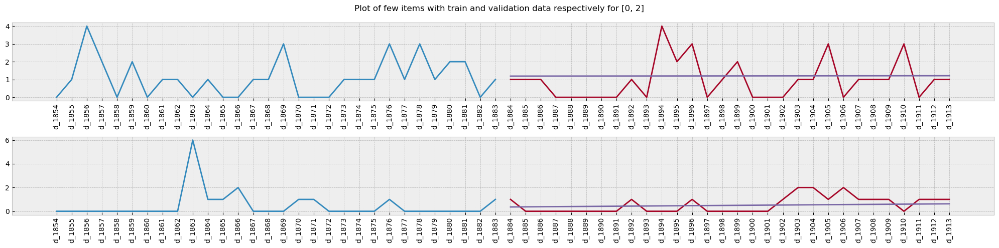

In [100]:
ids = [0, 2]
pred, error_holt= holt_smoothing()
plot_graphs(ids, pred, True)

## 4. Exponential smoothing or holt-Winter smoothing - This take both trend and seasonality into consideration.

The Holt-Winters smoothing method is a time series forecasting technique that can capture seasonality, trends, and short-term variations in data. It uses three equations to make forecasts based on the observed data and the values of the smoothing parameters. The method is particularly useful for forecasting data with strong seasonal patterns.

In [101]:
def winter_smoothing():
    predictions = []
    for row in tqdm(train_dataset[train_dataset.columns[-30:]].values):
        fit = ExponentialSmoothing(row, seasonal_periods=3).fit()
        predictions.append(fit.forecast(30))
    predictions = np.array(predictions).reshape(-1, 30) # Reshaping to make sure it has 30 columns
    error_norm = np.linalg.norm(predictions[:3] - val_dataset[:3]/len(predictions[0]))
    return predictions, float(error_norm)

  0%|          | 0/30490 [00:00<?, ?it/s]

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/py38forecasting/lib/python

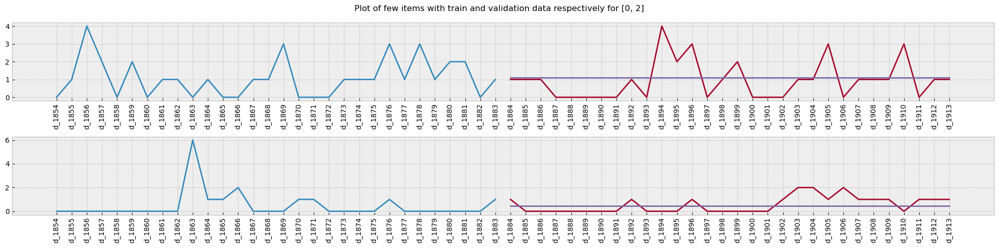

In [102]:
ids = [0, 2]
pred, error_winter = winter_smoothing()
plot_graphs(ids, pred, True)

## 5. SARIMA model - Auto Regressive Integrated Moving Average, aim to describe correlations in time series.

ARIMA is a method for forecasting or predicting future outcomes based on a historical time series. It is based on the statistical concept of serial correlation, where past data points influence future data points.

In [140]:
# Testing for stationarity using dickey fuller's test
from statsmodels.tsa.stattools import adfuller

In [141]:
def adfuller_test(val):
    result = adfuller(val)
    labels = ['ADF test statistics', 'p-value', '#Lags used', 'No of observations used']
    for value, label in zip(result, labels):
        print(label + ':' + str(value))
    if result[1] <= 0.05:
        print('Stationary')
    else:
        print('Non-stationary')

In [142]:
adfuller_test(train_dataset[train_dataset.columns[-30:]].values[2:3][0])

ADF test statistics:-2.3516987258045967
p-value:0.1558354966105508
#Lags used:2
No of observations used:27
Non-stationary


ADF test statistics:-6.183469424008424
p-value:6.372001404882315e-08
#Lags used:0
No of observations used:52
Stationary


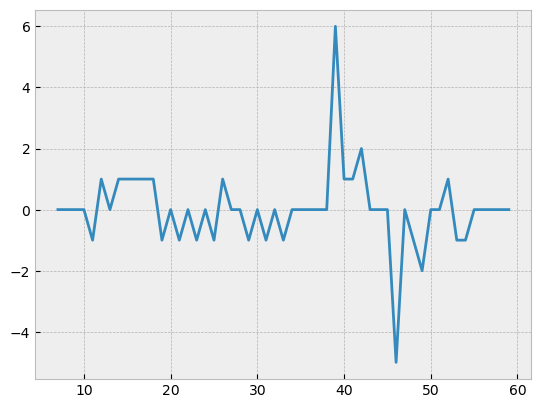

In [143]:
# Differencing to make it stationary
example = (train_dataset[train_dataset.columns[-60:]].loc[2]).reset_index()
example.columns = ['index', 'sales']

# Number by which the seasonality is present, if the seasonal cycle is 1 cycle in 12 months then, we pass 12 
example['seasonal first difference'] = example['sales'] - example['sales'].shift(7) #For us it is 7 
#print(example)
adfuller_test(example['seasonal first difference'].dropna())
example['seasonal first difference'].dropna().plot()
plt.show()

Auto-correlation and partial auto-correlation to determine the lags as in how many previous days data I need to consider to make good predictions

p,d,q - p for AR model lags, d for differencing, q for MA lags  
AR model lags are best estimated with PACF, and MA model is best done with ACF

In [144]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



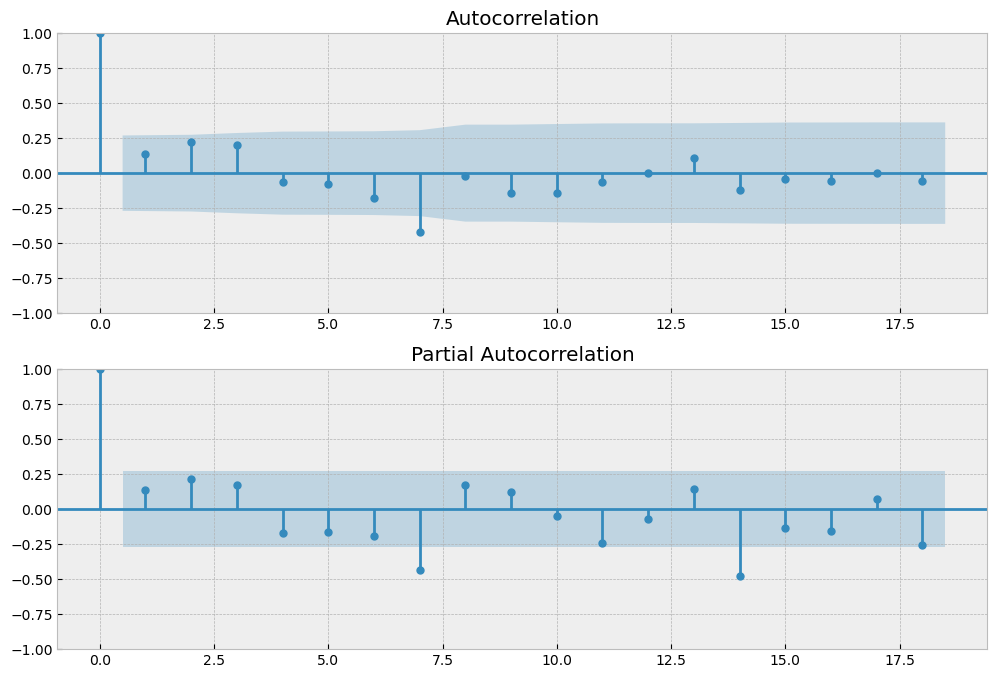

In [145]:
fig = plt.figure(figsize=(12,8))
ax1=fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(example['seasonal first difference'].dropna(),ax=ax1)
ax2=fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(example['seasonal first difference'].dropna(),ax=ax2)

In [146]:
(train_dataset[train_dataset.columns[-1:]].d_1883.values)

array([1, 1, 1, ..., 2, 1, 2])

In [147]:
def arima():
    predictions = []
    y_hats = []
    for row in tqdm(train_dataset[train_dataset.columns[-30:]].values[:3]):
        fit = sm.tsa.statespace.SARIMAX(row, seasonal_order=(0,1,1,7)).fit()
        predictions.append(fit.forecast(30))
        print('aic: ', fit.aic)
        y_hats.append(fit.predict(start=len(row), end=(len(row))))
    predictions = np.array(predictions).reshape(-1, 30)
    error_norm = np.linalg.norm(predictions[:3]-val_dataset[:3]/len(predictions[0]))
    return predictions, float(error_norm)

  0%|          | 0/3 [00:00<?, ?it/s]

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning:

Non-invertible starting seasonal moving average Using zeros as starting parameters.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.33880D+00    |proj g|=  5.86242D-02

At iterate    5    f=  1.31653D+00    |proj g|=  6.99275D-03

At iterate   10    f=  1.31623D+00    |proj g|=  4.92795D-03

At iterate   15    f=  1.31618D+00    |proj g|=  1.86122D-03

At iterate   20    f=  1.31617D+00    |proj g|=  1.05917D-03

At iterate   25    f=  1.31617D+00    |proj g|=  6.73509D-04

At iterate   30    f=  1.31617D+00    |proj g|=  5.68990D-05

At iterate   35    f=  1.31617D+00    |proj g|=  6.54439D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  5.56236D-01    |proj g|=  1.02729D-02

At iterate   15    f=  5.56125D-01    |proj g|=  6.68856D-03

At iterate   20    f=  5.56112D-01    |proj g|=  7.62003D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     40      1     0     0   1.999D-04   5.561D-01
  F =  0.55611157578017079     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
aic:  39.366694546810244
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.53335D+00    |proj 

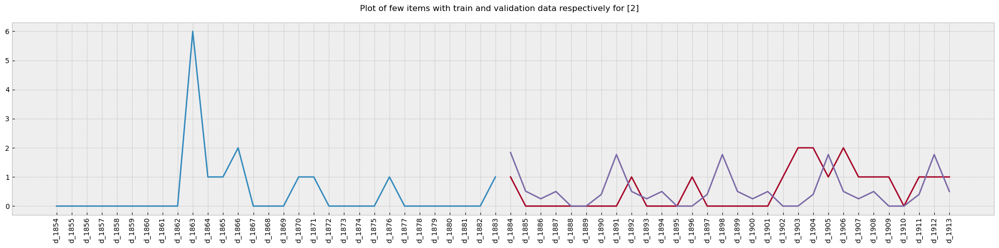

In [148]:
ids = [2]
pred, error_arima = arima()
plot_graphs(ids, pred, True)

## 6. facebook prophet - additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, including holiday effects

Plotting prophet forecast

In [150]:
holidays = cal_data[cal_data['event_type_1'].isnull() == False]
holidays = holidays[['date','event_name_1', 'event_type_1']]
holidays.rename(columns={'date':'ds','event_name_1':'holiday'},inplace=True)

In [151]:
def prophet():
    predictions = []
    forecasts = []
    models = []
    dates = ["2007-12-" + str(i) for i in range(1, 31)]
    for row in tqdm(train_dataset[train_dataset.columns[-30:]].values[:3]):
        df = pd.DataFrame(np.transpose([dates, row]))
        df.columns = ['ds', 'y']
        model = Prophet(daily_seasonality=True, holidays=holidays)
        model.fit(df)
        future = model.make_future_dataframe(periods=30)
        forecast = model.predict(future)
        forecasts.append(forecast)
        models.append(model)
        predictions.append(forecast['yhat'].loc[30:].values)
    predictions = np.array(predictions).reshape(-1,30)
    error_norm = np.linalg.norm(predictions[:3] - val_dataset[:3]/len(predictions[0]))
    return predictions, float(error_norm), forecasts, models

  0%|          | 0/3 [00:00<?, ?it/s]

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

INFO:fbprophet:n_changepoints greater than number of observations. Using 23.
/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is


Initial log joint probability = -125.092
Iteration  1. Log joint probability =    17.6199. Improved by 142.712.
Iteration  2. Log joint probability =    27.5602. Improved by 9.9403.
Iteration  3. Log joint probability =    27.7191. Improved by 0.15893.
Iteration  4. Log joint probability =    28.0294. Improved by 0.31024.
Iteration  5. Log joint probability =    28.0514. Improved by 0.0219977.
Iteration  6. Log joint probability =    28.0584. Improved by 0.00697792.
Iteration  7. Log joint probability =     28.064. Improved by 0.00564507.
Iteration  8. Log joint probability =     28.066. Improved by 0.00195651.
Iteration  9. Log joint probability =    28.0666. Improved by 0.000671037.
Iteration 10. Log joint probability =    28.0678. Improved by 0.00118667.
Iteration 11. Log joint probability =    28.0684. Improved by 0.000611696.
Iteration 12. Log joint probability =    28.0685. Improved by 7.06703e-05.
Iteration 13. Log joint probability =    28.0686. Improved by 7.27821e-05.
Iterat

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.c


Initial log joint probability = -134.658
Iteration  1. Log joint probability =    8.00052. Improved by 142.659.
Iteration  2. Log joint probability =    15.0116. Improved by 7.0111.
Iteration  3. Log joint probability =    15.2596. Improved by 0.24799.
Iteration  4. Log joint probability =    15.5058. Improved by 0.246176.
Iteration  5. Log joint probability =    15.5242. Improved by 0.0184053.
Iteration  6. Log joint probability =    15.5459. Improved by 0.0216882.
Iteration  7. Log joint probability =    15.5548. Improved by 0.00888363.
Iteration  8. Log joint probability =    15.5567. Improved by 0.00197873.
Iteration  9. Log joint probability =    15.5584. Improved by 0.00169628.
Iteration 10. Log joint probability =    15.5606. Improved by 0.00220613.
Iteration 11. Log joint probability =    15.5623. Improved by 0.00168581.
Iteration 12. Log joint probability =    15.5628. Improved by 0.000436209.
Iteration 13. Log joint probability =     15.563. Improved by 0.000204816.
Iteratio

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

INFO:fbprophet:n_changepoints greater than number of observations. Using 23.
/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is


Initial log joint probability = -124.244
Iteration  1. Log joint probability =    22.7119. Improved by 146.956.
Iteration  2. Log joint probability =     30.096. Improved by 7.38412.
Iteration  3. Log joint probability =    35.9436. Improved by 5.84767.
Iteration  4. Log joint probability =    37.3766. Improved by 1.43298.
Iteration  5. Log joint probability =    37.8158. Improved by 0.439168.
Iteration  6. Log joint probability =    38.2235. Improved by 0.407732.
Iteration  7. Log joint probability =    38.2722. Improved by 0.0486616.
Iteration  8. Log joint probability =    38.3191. Improved by 0.0469028.
Iteration  9. Log joint probability =    38.3351. Improved by 0.0160123.
Iteration 10. Log joint probability =    38.3409. Improved by 0.00577946.
Iteration 11. Log joint probability =    38.3481. Improved by 0.00722566.
Iteration 12. Log joint probability =    38.3494. Improved by 0.00128822.
Iteration 13. Log joint probability =    38.3496. Improved by 0.000161481.
Iteration 14. 

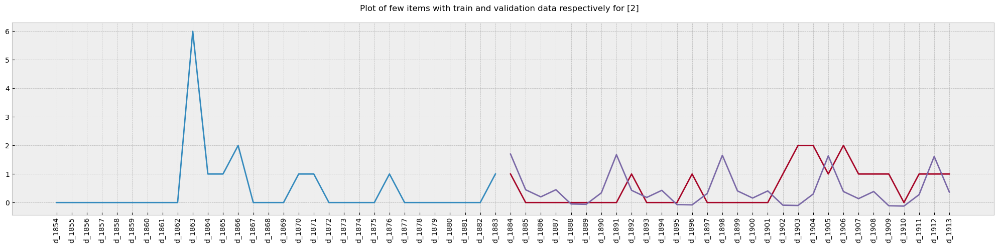

In [152]:
ids = [2]
pred, error_prophet, forecasts, models = prophet()
plot_graphs(ids, pred, True)

Plotting prophet forecast

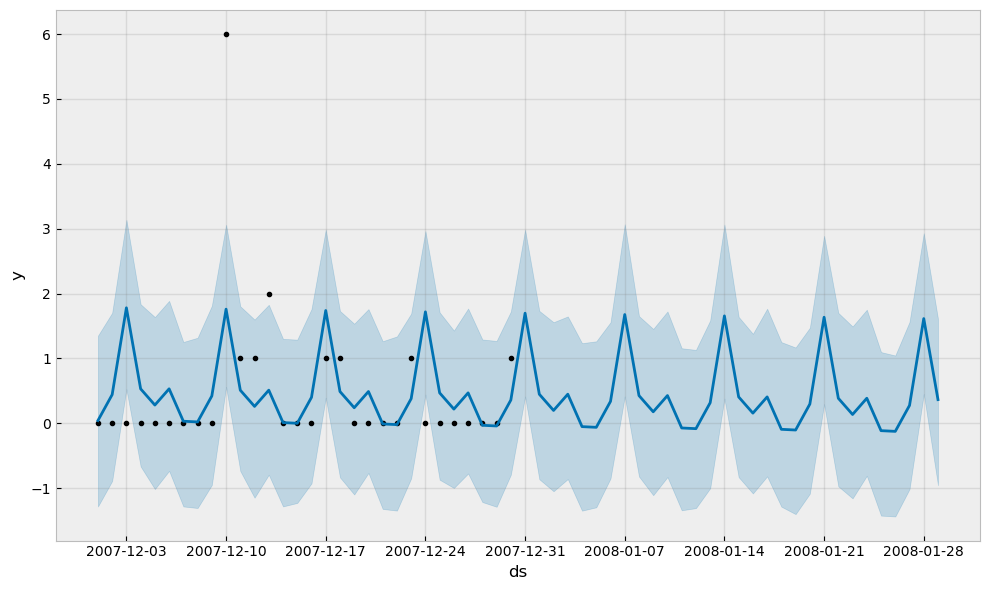

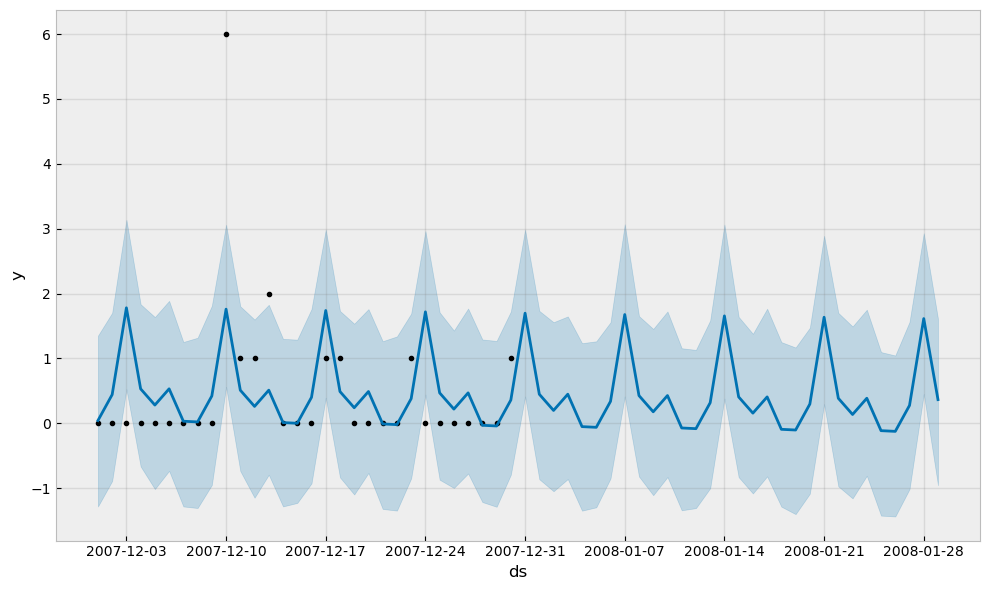

In [153]:
model2 = models[2]
forecast2 = forecasts[2]

model2.plot(forecast2)

Plotting forecast componenets

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/opt/anaconda3/envs/py38forecasting/lib/python3.8/site-packages/fbprophet/forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



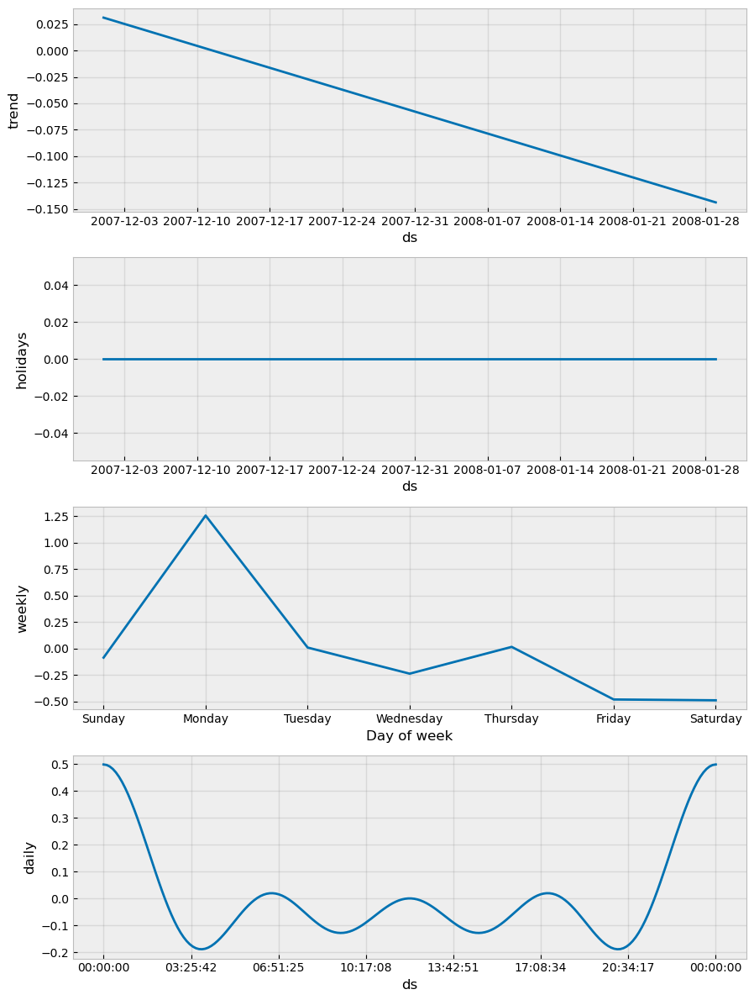

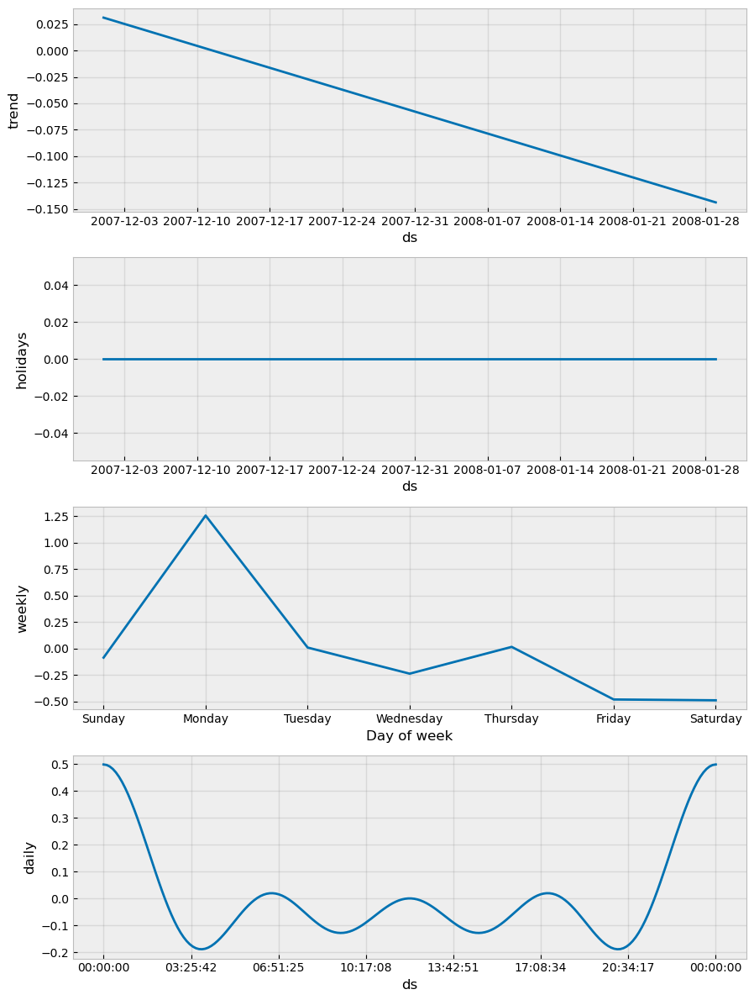

In [154]:
model2.plot_components(forecast2)

In [155]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

In [156]:
fig = plot_plotly(model2, forecast2)
py.iplot(fig)

7. Error Loss of all models 

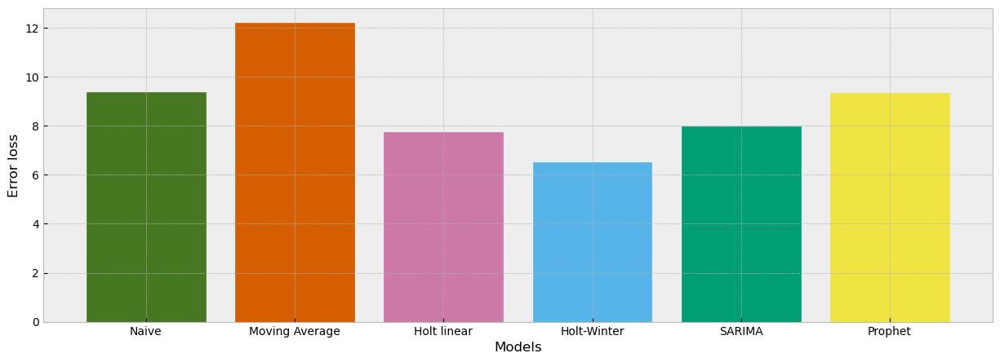

In [158]:
x_axis = ['Naive', 'Moving Average', 'Holt linear', 'Holt-Winter', 'SARIMA', 'Prophet']
y_axis = [error_naive, error_moving, error_holt, error_winter, error_arima, error_prophet]
loss_df = pd.DataFrame(np.transpose([x_axis, y_axis]))
loss_df.columns = ['model', 'error']
for i in range(6):
    loss_df['error'][i] = float(loss_df['error'][i])

plt.figure(figsize=(15,5))
bplot = plt.bar(x_axis, loss_df['error'])

#fill different colors for bar plot
colors = [next(color_cycle) for i in range(0,6)]
for i, b in enumerate(bplot):
    b.set_color(colors[i])
    
plt.xlabel('Models')
plt.ylabel('Error loss')
plt.show()